# Lab session 6: Decision tree
__Name: Anthra Devarajan<br>
Registration number: 19BCE1681<br>
Course code: CSE4020<br>
Faculty: Dr. Abdul Quadir<br>
Slot: L31 + L32<br>
Date: 21-September-2021 Monday__

In [2]:
import pandas as pd 
import numpy as np 
from sklearn.tree import DecisionTreeClassifier 
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

# Part 1: Code from the text file for practice

In [3]:
# download the dataset and storing it in iris_df
data_url = "https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data"
iris_df = pd.read_csv(data_url,
                   names = ['sepal_l',
                             'sepal_w',
                              'petal_l',
                            'petal_w',
                           'class'])
iris_df.head(100)
# different class labels avaliable
iris_df['class'].unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

In [4]:
classes = {
    
    'Iris-setosa': 0,
    'Iris-versicolor' : 1,
    'Iris-virginica' : 2
    }
iris_df = iris_df.replace({'class': classes})
iris_df.head(100)

,sepal_l,sepal_w,petal_l,petal_w,class
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
95,5.7,3.0,4.2,1.2,1
96,5.7,2.9,4.2,1.3,1
97,6.2,2.9,4.3,1.3,1
98,5.1,2.5,3.0,1.1,1


In [5]:
X = iris_df.iloc[:,:4]
Y = iris_df.iloc[:,4]
#converting it into an array
X = np.array (X)
Y = np.array (Y)

In [6]:
X

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [7]:
Y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [8]:
iris_df.shape

(150, 5)

## Entropy criterion

In [9]:
# not splitting into training and testing 

tree = DecisionTreeClassifier(criterion = 'entropy')
tree.fit(X, Y)

DecisionTreeClassifier(criterion='entropy')

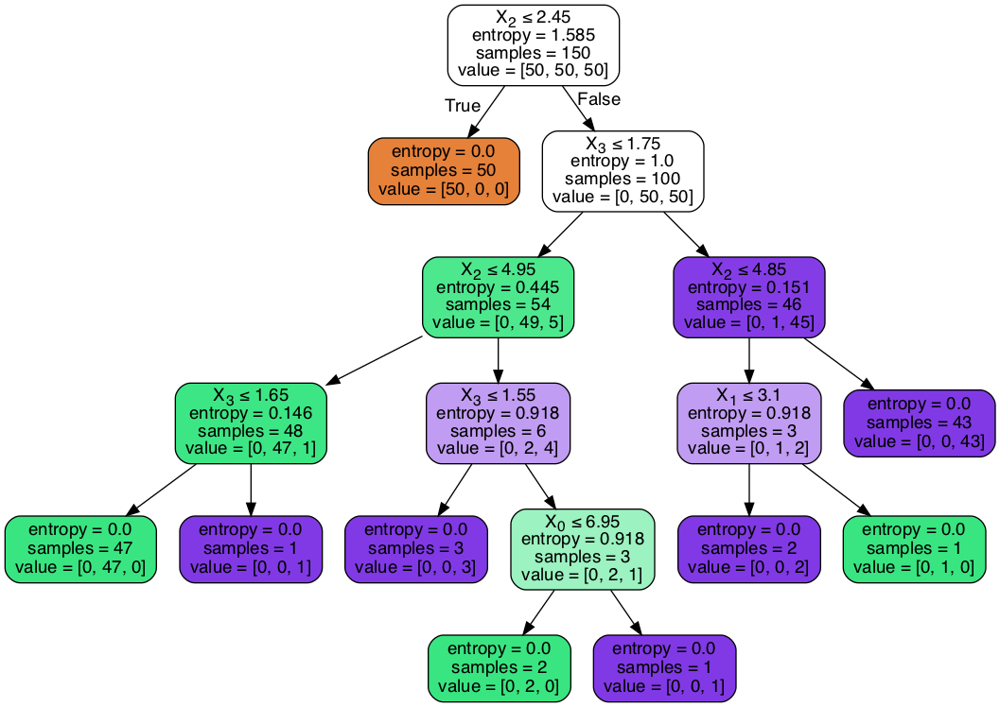

In [10]:
#storing it into the var dot_data
dot_data = StringIO()
export_graphviz(tree, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png(), width=300, height=10)

In [11]:
predict = tree.predict(X)
predict

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [12]:
from sklearn import metrics
print('Accuracy:', metrics.accuracy_score(Y, predict))

Accuracy: 1.0


## Gini criterion

In [16]:
# not splitting into training and testing 
tree2 = DecisionTreeClassifier(criterion = 'gini')
tree2.fit(X, Y)

DecisionTreeClassifier()

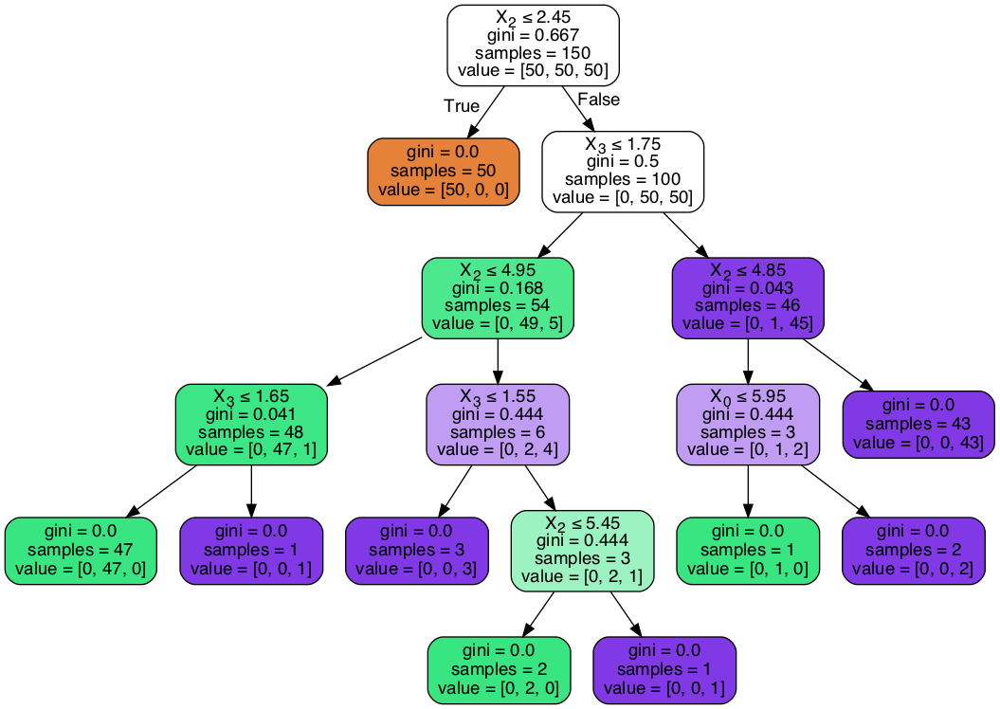

In [17]:
#storing it into the var dot_data
dot_data = StringIO()
export_graphviz(tree2, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png(), width=300, height=10)

In [38]:
predict2 = tree2.predict(X)
predict2

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [19]:
from sklearn import metrics
print('Accuracy:', metrics.accuracy_score(Y, predict2))

Accuracy: 1.0


## Naive Bayes

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)

In [21]:
print('Accuracy:', metrics.accuracy_score(y_test, y_pred))

Accuracy: 1.0


# Part 2: A new dataset - crabs

The crabs data frame has 200 rows and 8 columns, describing 5 morphological measurements on 50 crabs each of two colour forms and both sexes, of the species Leptograpsus variegatus collected at Fremantle, W. Australia.

This data frame contains the following columns:<br>
sp: species - "B" or "O" for blue or orange.<br>
sex: as it says.<br>
index: index 1:50 within each of the four groups.<br>
FL: frontal lobe size (mm).<br>
RW: rear width (mm).<br>
CL: carapace length (mm).<br>
CW: carapace width (mm).<br>
BD: body depth (mm).<br>

In [50]:
df = pd.read_csv("crabs.csv")
df.head(100)
# different class labels avaliable
df['sp'].unique()

array(['B', 'O'], dtype=object)

In [51]:
sp = {
    'B': 0,
    'O' : 1,
    }
df = df.replace({'sp': sp})
df.head(100)

,n,sp,sex,index,FL,RW,CL,CW,BD
0,1,0,M,1,8.1,6.7,16.1,19.0,7.0
1,2,0,M,2,8.8,7.7,18.1,20.8,7.4
2,3,0,M,3,9.2,7.8,19.0,22.4,7.7
3,4,0,M,4,9.6,7.9,20.1,23.1,8.2
4,5,0,M,5,9.8,8.0,20.3,23.0,8.2
...,...,...,...,...,...,...,...,...,...
95,96,0,F,46,16.4,14.0,34.2,39.8,15.2
96,97,0,F,47,16.7,16.1,36.6,41.9,15.4
97,98,0,F,48,17.4,16.9,38.2,44.1,16.6
98,99,0,F,49,17.5,16.7,38.6,44.5,17.0


In [52]:
sex = {
    'M': 0,
    'F' : 1,
    }
df = df.replace({'sex': sex})
df.head(100)

,n,sp,sex,index,FL,RW,CL,CW,BD
0,1,0,0,1,8.1,6.7,16.1,19.0,7.0
1,2,0,0,2,8.8,7.7,18.1,20.8,7.4
2,3,0,0,3,9.2,7.8,19.0,22.4,7.7
3,4,0,0,4,9.6,7.9,20.1,23.1,8.2
4,5,0,0,5,9.8,8.0,20.3,23.0,8.2
...,...,...,...,...,...,...,...,...,...
95,96,0,1,46,16.4,14.0,34.2,39.8,15.2
96,97,0,1,47,16.7,16.1,36.6,41.9,15.4
97,98,0,1,48,17.4,16.9,38.2,44.1,16.6
98,99,0,1,49,17.5,16.7,38.6,44.5,17.0


In [53]:
df.drop(['n'], axis=1)

,sp,sex,index,FL,RW,CL,CW,BD
0,0,0,1,8.1,6.7,16.1,19.0,7.0
1,0,0,2,8.8,7.7,18.1,20.8,7.4
2,0,0,3,9.2,7.8,19.0,22.4,7.7
3,0,0,4,9.6,7.9,20.1,23.1,8.2
4,0,0,5,9.8,8.0,20.3,23.0,8.2
...,...,...,...,...,...,...,...,...
195,1,1,46,21.4,18.0,41.2,46.2,18.7
196,1,1,47,21.7,17.1,41.7,47.2,19.6
197,1,1,48,21.9,17.2,42.6,47.4,19.5
198,1,1,49,22.5,17.2,43.0,48.7,19.8


In [54]:
X = df.iloc[:, 1:7]
Y = df.iloc[:,0]
#converting it into an array
X = np.array (X)
Y = np.array (Y)

In [55]:
X

array([[ 0. ,  0. ,  1. ,  8.1,  6.7, 16.1],
       [ 0. ,  0. ,  2. ,  8.8,  7.7, 18.1],
       [ 0. ,  0. ,  3. ,  9.2,  7.8, 19. ],
       ...,
       [ 1. ,  1. , 48. , 21.9, 17.2, 42.6],
       [ 1. ,  1. , 49. , 22.5, 17.2, 43. ],
       [ 1. ,  1. , 50. , 23.1, 20.2, 46.2]])

In [56]:
Y

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [57]:
df.shape

(200, 9)

## Entroy criterion

In [58]:
# not splitting into training and testing 

tree = DecisionTreeClassifier(criterion = 'entropy')
tree.fit(X, Y)

DecisionTreeClassifier(criterion='entropy')

In [59]:
#storing it into the var dot_data
dot_data = StringIO()
export_graphviz(tree, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.57282 to fit



In [60]:
predict = tree.predict(X)
predict

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [61]:
from sklearn import metrics
print('Accuracy:', metrics.accuracy_score(Y, predict))

Accuracy: 1.0


## Gini criterion

In [62]:
# not splitting into training and testing 

tree2 = DecisionTreeClassifier(criterion = 'gini')
tree2.fit(X, Y)

DecisionTreeClassifier()

In [63]:
#storing it into the var dot_data
dot_data = StringIO()
export_graphviz(tree2, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [70]:
predict2 = tree2.predict(X)
predict2

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [71]:
from sklearn import metrics
print('Accuracy:', metrics.accuracy_score(Y, predict2))

Accuracy: 1.0


## Naive bayes

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)

In [73]:
print('Accuracy:', metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.0
